test

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud, STOPWORDS
import seaborn as sns
import random
import string
sns.set(font_scale=2)

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## word vecs

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/DS4400 - Group/spotify_songs.csv')
lyric_idx = {}
corpus = []
idx = 0


for i in range(len(data)):
    lyrics = str(data['lyrics'][i])
    lyrics = lyrics.translate(None, string.punctuation)
    lyrics_lower = lyrics.lower()
    tokens = lyrics_lower.split(' ')
    corpus.append(tokens)
    for lyric in tokens:
        if lyric not in lyric_idx:
            lyric_idx[lyric] = idx
            idx += 1

# sample five random ingredients and their indices
keys = random.sample(list(lyric_idx), 5)
values = [lyric_idx[k] for k in keys]
print(dict(zip(keys, values)))



KeyboardInterrupt: ignored

## other

In [ ]:
from collections import defaultdict
data = pd.read_csv('/content/drive/MyDrive/DS4400 - Group/spotify_songs.csv')
d ={'rock':0, 'r&b':1,'pop':2, 'edm':3, 'latin':4, 'rap':5}



# y = playlist_genre


df = data[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'playlist_genre', 'playlist_subgenre']]

df['target_val'] = df['playlist_genre'].map(d)
df.head()




<ipython-input-3-21fb6a58fc9f>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target_val'] = df['playlist_genre'].map(d)


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,playlist_genre,playlist_subgenre,target_val
0,0.682,0.401,2,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,rock,classic rock,0
1,0.303,0.880,9,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,rock,hard rock,0
2,0.845,0.652,6,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,r&b,new jack swing,1
3,0.425,0.378,5,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,r&b,neo soul,1
4,0.760,0.887,9,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,pop,dance pop,2


In [ ]:
data.columns

Index(['track_id', 'track_name', 'track_artist', 'lyrics', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'language'],
      dtype='object')

        PC1       PC2  target
0  2.108881 -0.239080       0
1 -1.307624  2.982285       0
2 -0.494457 -1.359365       1
3  2.251954  0.735770       1
4 -1.697732  0.211611       2


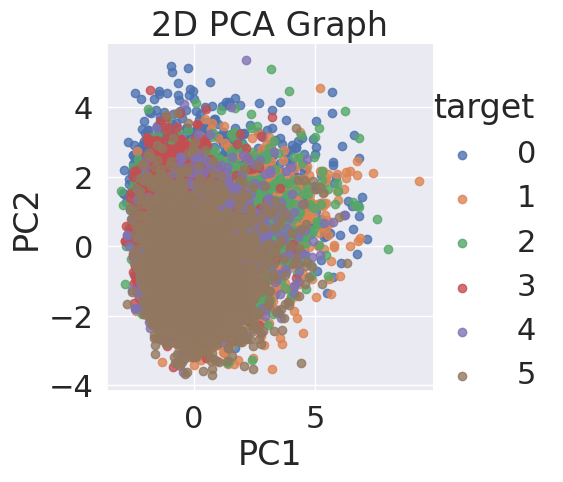

In [ ]:
y = df.loc[:,"playlist_genre"]

X = df[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms']]


from sklearn.preprocessing import StandardScaler
scaling=StandardScaler()
scaling.fit(X)
Scaled_X=scaling.transform(X)

from sklearn.decomposition import PCA

pca=PCA(n_components=2)
pca.fit(Scaled_X)
x=pca.transform(Scaled_X)

pca_df = pd.DataFrame(
    data=x, 
    columns=['PC1', 'PC2'])

pca_df['target'] = y
pca_df['target'] = pca_df['target'].map(d)
 
print(pca_df.head())

sns.lmplot(
    x='PC1', 
    y='PC2', 
    data=pca_df, 
    hue='target', 
    fit_reg=False, 
    legend=True
    )
 
plt.title('2D PCA Graph')
plt.show()

KNN

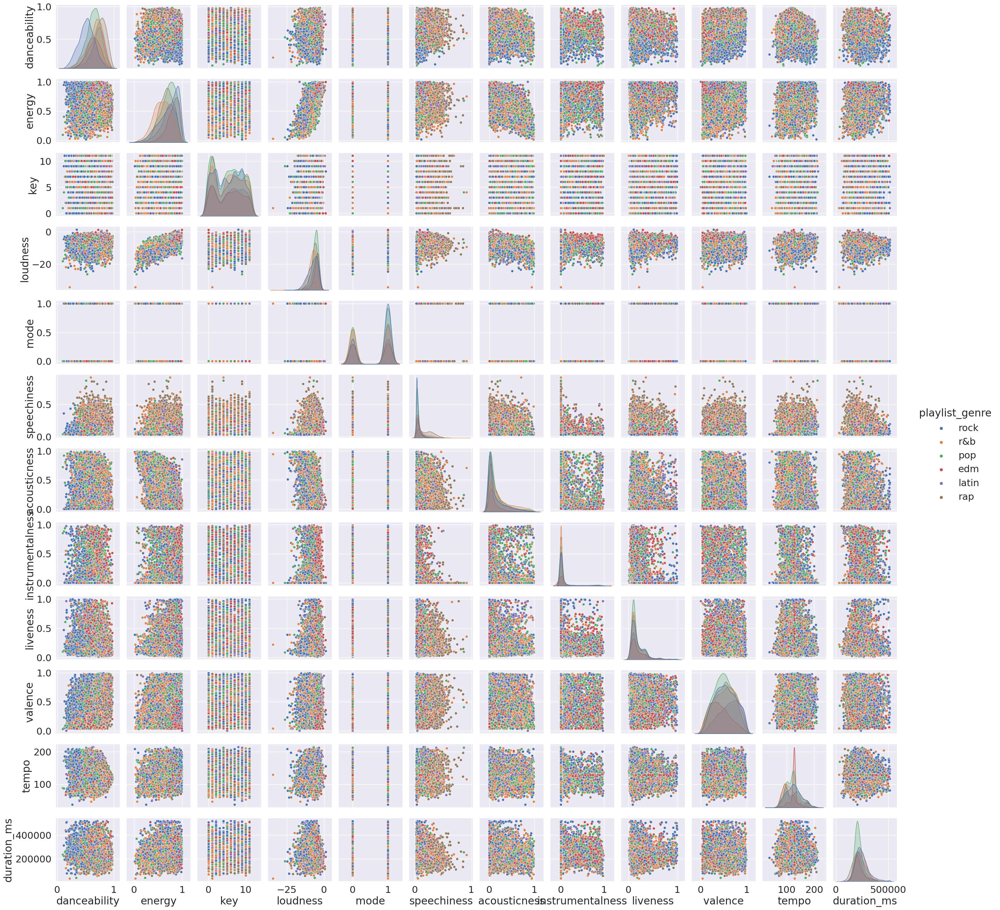

In [ ]:
pair = df.drop(columns = ['playlist_subgenre', 'target_val'])
sns.pairplot(pair, hue = 'playlist_genre')
plt.show();

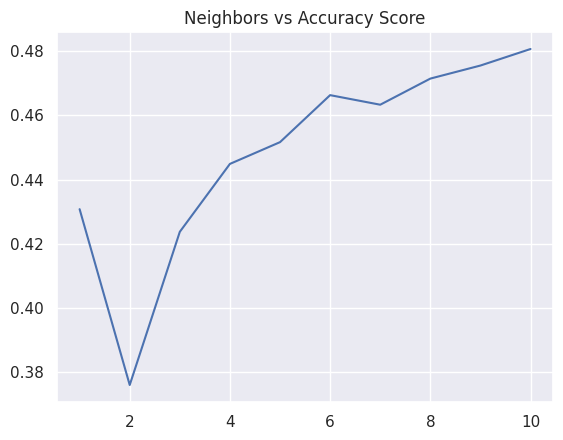

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
y = df.loc[:,"playlist_genre"]
X_train, X_test, y_train, y_test = train_test_split(Scaled_X, y, test_size=0.2, random_state = 1)
accs = []
for n in range(1,11):
  knn_clf=KNeighborsClassifier(n_neighbors=n)
  knn_clf.fit(X_train,y_train)
  ypred=knn_clf.predict(X_test)
  acc = accuracy_score(y_test,ypred)
  accs.append(acc)
plt.plot(range(1,11), accs)
plt.title('Neighbors vs Accuracy Score');

In [ ]:
knn_clf=KNeighborsClassifier(n_neighbors = 10)
knn_clf.fit(X_train,y_train)
ypred=knn_clf.predict(X_test)


              precision    recall  f1-score   support

         edm       0.40      0.55      0.47       409
       latin       0.33      0.37      0.35       437
         pop       0.35      0.41      0.38       784
         r&b       0.44      0.39      0.41       674
         rap       0.60      0.47      0.52       693
        rock       0.61      0.55      0.58       694

    accuracy                           0.45      3691
   macro avg       0.46      0.45      0.45      3691
weighted avg       0.47      0.45      0.46      3691
, accuracy = 0.4516391221891086


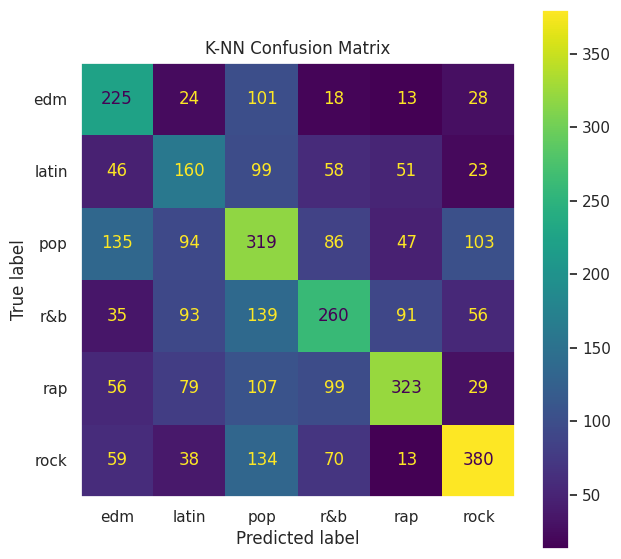

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
conf_mat = confusion_matrix(y_true=y_test, y_pred=ypred)
conf_mat_disp = ConfusionMatrixDisplay(conf_mat, display_labels=np.unique(y_test))

sns.set(font_scale=1)
conf_mat_disp.plot()

plt.gcf().set_size_inches(7, 7)
plt.grid(False)
plt.title('K-NN Confusion Matrix');
result1 = classification_report(y_test, ypred)
result2 = accuracy_score(y_test,ypred)
print(f'{result1}, accuracy = {result2}')

K-means

In [ ]:
from sklearn.cluster import KMeans

NUM_CLUSTERS = 8

kmeans = KMeans(n_clusters=NUM_CLUSTERS, random_state=0, n_init="auto")
# kmeans.fit(pca_df)
kmeans.fit(X)

# print(kmeans.labels_)
# print(kmeans.cluster_centers_)



out = kmeans.predict(X.iloc[10].to_numpy().reshape(1, -1))
print(kmeans.cluster_centers_[out[0]])


[ 6.70790820e-01  7.01874098e-01  5.31508197e+00 -6.28247770e+00
  5.73114754e-01  1.16791541e-01  1.80081402e-01  4.12774388e-02
  1.87415541e-01  5.29782262e-01  1.21310940e+02  1.75206384e+05]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


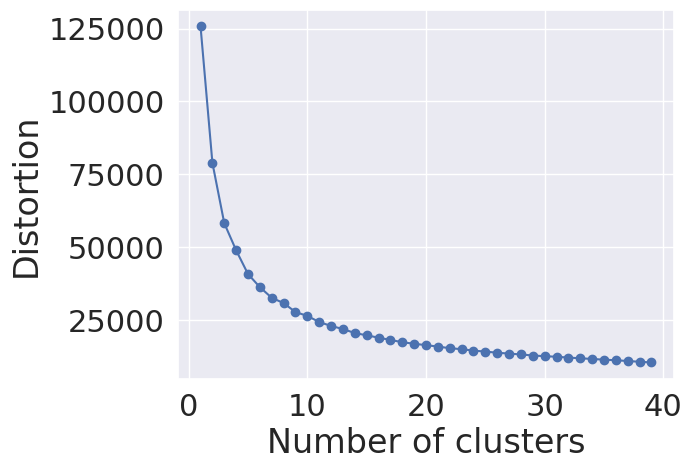

In [ ]:
distortions = []

range_clusters = (1, 40)

for i in range(range_clusters[0], range_clusters[1]):
    km = KMeans(n_clusters=i, random_state=0, n_init="auto")
    km.fit(pca_df)
    distortions.append(km.inertia_)

# plot
plt.plot(range(range_clusters[0], range_clusters[1]), distortions, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

# T-SNE

In [ ]:
y = df.loc[:,"playlist_subgenre"]

X = df[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms']]


from sklearn.preprocessing import StandardScaler
scaling=StandardScaler()
scaling.fit(X)
Scaled_X=scaling.transform(X)

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, learning_rate='auto',
            init='random').fit_transform(Scaled_X)

tsne

array([[ -2.8262177,  62.86655  ],
       [ 12.655175 , -35.263065 ],
       [-10.643061 , -44.25449  ],
       ...,
       [-33.80793  ,  15.577832 ],
       [-84.759186 , -30.227373 ],
       [ 24.904434 ,  29.722296 ]], dtype=float32)

In [ ]:
tsne_df = pd.DataFrame(tsne)
y = df.loc[:,"playlist_genre"]

tsne_df.columns = ["x", "y"]
tsne_df['genre'] = y
tsne_df.head()

,x,y,genre
0,-2.826218,62.866550,classic rock
1,12.655175,-35.263065,hard rock
2,-10.643061,-44.254490,new jack swing
3,-22.904053,16.265829,neo soul
4,53.893284,-15.057185,dance pop


<Axes: xlabel='x', ylabel='y'>

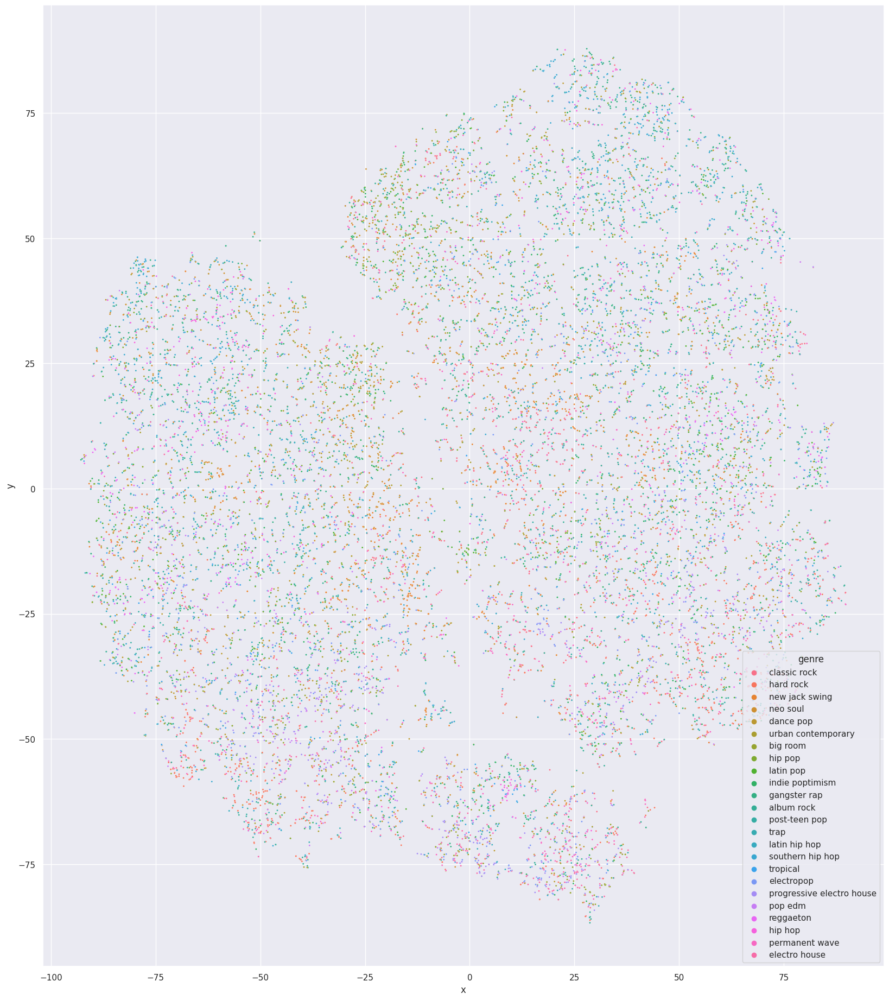

In [ ]:
# sns.set(rc={'figure.figsize':(20, 23)})
sns.scatterplot(data=tsne_df, x="x", y="y",
                # fit_reg=False, 
                legend=True,
                hue="genre",
                s=5
               )
# plt.legend(fontsize='10', title_fontsize='14')
# plt.title('2D PCA Graph')
# plt.show()

# Exploratory Data Analysis

In [ ]:
def genre_count(df):
    genres = df.groupby('playlist_genre')['track_id'].count().reset_index().sort_values('track_id', ascending=False)
    genres.plot(x='playlist_genre', y='track_id', kind='bar', legend=False, title='Songs per Genre',
                xlabel='Genre', ylabel='Count')
    plt.show()


In [ ]:
def word_count_cloud(df, n):
    lyrics = ''.join(df['lyrics'].tolist())
    wordcloud = WordCloud().generate(lyrics)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

In [ ]:
df = pd.read_csv('spotify_songs.csv')
df = df.dropna(subset = 'lyrics')
genre_count(df)
word_count_cloud(df, 5)
for col in df.columns[17:22]:
    plt.hist(df[str(col)],
              label=col, alpha=0.5)

plt.legend(loc='upper right')
plt.xlabel('feature')
plt.ylabel('count')
plt.title('Overlapping')
plt.show()

sns.set(font_scale=0.5)
df_num = df.iloc[:, 12:24]
corr = df_num.corr()
# Generate a mask for upper traingle
#
mask = np.triu(np.ones_like(corr, dtype=bool))
#
# Configure a custom diverging colormap
#
cmap = sns.diverging_palette(230, 20, as_cmap=True)
#
# Draw the heatmap
#
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap)
plt.title('Correlation Matrix')
plt.show()

# Spotify API Integration


In [ ]:
pip install spotipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.6/238.6 KB 8.3 MB/s eta 0:00:00


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

spotify = spotipy.Spotify(client_credentials_manager=SpotifyClientCredentials(client_id="0b0584e58353452fb0601fc618d5f81e", client_secret="a1eaee62a31647c5bcdb0f330bb139eb"))
track_uri = "https://open.spotify.com/track/7p4vHnYXkxlzvfePJVpcTr?si=cd1786609acb4cb9"

spotify.audio_features(track_uri)[0]

{'danceability': 0.55,
 'energy': 0.596,
 'key': 7,
 'loudness': -8.214,
 'mode': 1,
 'speechiness': 0.134,
 'acousticness': 0.162,
 'instrumentalness': 0.00481,
 'liveness': 0.0805,
 'valence': 0.253,
 'tempo': 165.736,
 'type': 'audio_features',
 'id': '7p4vHnYXkxlzvfePJVpcTr',
 'uri': 'spotify:track:7p4vHnYXkxlzvfePJVpcTr',
 'track_href': 'https://api.spotify.com/v1/tracks/7p4vHnYXkxlzvfePJVpcTr',
 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/7p4vHnYXkxlzvfePJVpcTr',
 'duration_ms': 297404,
 'time_signature': 4}